In [ ]:
import anndata as ad
import matplotlib.pyplot as plt
import muon as mu
import pandas as pd
import scanpy as sc
import scirpy as ir
import numpy as np
import os
from matplotlib.ticker import FuncFormatter, PercentFormatter
sc.set_figure_params(figsize=(4, 4))
sc.settings.verbosity = 2  # verbosity: errors (0), warnings (1), info (2), hints (3)
ir.__version__
figPath = "figure-4.10"

BCMprefix = "/data/BCM/BCM_BCR/"
BCMFiles = os.listdir(BCMprefix)
suffix = "/outs/all_contig_annotations.json"
bcm_bcr = ir.io.read_10x_vdj(f"{BCMprefix}{BCMFiles[0]}{suffix}", filtered=True)
bcm_bcr.obs_names = [f"{s}-{BCMFiles[0]}" for s in bcm_bcr.obs_names]
for i in range(1, len(BCMFiles)):
  bcm_ir = ir.io.read_10x_vdj(f"{BCMprefix}{BCMFiles[i]}{suffix}")
  bcm_ir.obs_names = [f"{s}-{BCMFiles[i]}" for s in bcm_ir.obs_names]
  bcm_bcr = ir.pp.merge_airr(bcm_bcr, bcm_ir)

BCMprefix = "/data/BCM/BCM_TCR/"
BCMFiles = os.listdir(BCMprefix)
suffix = "/outs/all_contig_annotations.json"
bcm_tcr = ir.io.read_10x_vdj(f"{BCMprefix}{BCMFiles[0]}{suffix}", filtered=True)
bcm_tcr.obs_names = [f"{s}-{BCMFiles[0]}" for s in bcm_tcr.obs_names]
for i in range(1, len(BCMFiles)):
  bcm_ir = ir.io.read_10x_vdj(f"{BCMprefix}{BCMFiles[i]}{suffix}")
  bcm_ir.obs_names = [f"{s}-{BCMFiles[i]}" for s in bcm_ir.obs_names]
  bcm_tcr = ir.pp.merge_airr(bcm_tcr, bcm_ir)
bcm_ir = ir.pp.merge_airr(bcm_bcr, bcm_tcr)

Filtering chains...
Indexing VJ chains...


Indexing VDJ chains...
build result array
Stored result in `adata.obs["receptor_type"]`.
Stored result in `adata.obs["receptor_subtype"]`.
Stored result in `adata.obs["chain_pairing"]`.


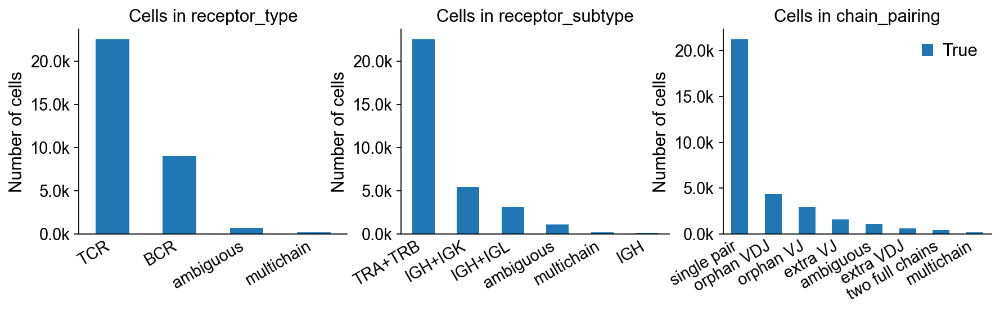

In [235]:
ir.pp.index_chains(bcm_ir)
ir.tl.chain_qc(bcm_ir)
# abundance of TCR,BCR targeting molecular_type
def ks(x, pos):
    return '%1.1fk' % (x*1e-3)
fig, ax = plt.subplots(1, 3,figsize=(13,3))
for i,g in enumerate(["receptor_type", "receptor_subtype", 'chain_pairing']):
  ir.pl.group_abundance(bcm_ir, groupby=g, 
                        ax=ax[i], 
                        style_kws={"title": "Cells in {}".format(g.split(":")[0]),
                                   "xlab": '',
                                   "title_fontsize":14, 
                                   "label_fontsize":14, 
                                   "tick_fontsize":13,
                                   "add_legend": True})
  ax[i].yaxis.set_major_formatter(FuncFormatter(ks))
ax[2].legend(fontsize=14,
      frameon=False, handletextpad=0.5, loc="best",
              borderpad=0.3,
              columnspacing=1.3,
              handlelength=0.65,)
fig.savefig(f"{figPath}/bcm-abundance-ir-molecular.png", dpi=300, bbox_inches='tight')

In [382]:
from collections import Counter
Counter(data_ir.obs['receptor_type'])

Counter({nan: 39142,
         'TCR': 23107,
         'BCR': 9353,
         'ambiguous': 554,
         'multichain': 110})

In [259]:
bcy_ir = sc.read_h5ad('adata-ir.h5ad')
bcy_preF = sc.read_h5ad("adata-preF.h5ad")


In [262]:
bcy_preF.obs_names = [f"{s.split('-')[0]}-1-{s.split('-')[1]}" for s in bcy_preF.obs_names]
bcydata = mu.MuData({'gex': bcy_preF, "airr":bcy_ir})

In [293]:
bcm_ir = sc.read_h5ad('BCM-ir.h5ad')
bcm_ir.obs_names_make_unique()
bcm_ir.var_names_make_unique()
bcm_preF = sc.read_h5ad("BCM-preF.h5ad")
bcm_preF.obs_names_make_unique()
bcm_preF.var_names_make_unique()
bcmdata = mu.MuData({'gex': bcm_preF, "airr":bcm_ir})


Filtering chains...
Indexing VJ chains...
Indexing VDJ chains...
build result array
Stored result in `mdata.obs["airr:receptor_type"]`.
Stored result in `mdata.obs["airr:receptor_subtype"]`.
Stored result in `mdata.obs["airr:chain_pairing"]`.


... storing 'airr:receptor_type' as categorical
... storing 'airr:receptor_subtype' as categorical
... storing 'airr:chain_pairing' as categorical
... storing 'airr:receptor_type' as categorical
... storing 'airr:receptor_subtype' as categorical
... storing 'airr:chain_pairing' as categorical
... storing 'airr:receptor_type' as categorical
... storing 'airr:receptor_subtype' as categorical
... storing 'airr:chain_pairing' as categorical
... storing 'airr:receptor_type' as categorical
... storing 'airr:receptor_subtype' as categorical
... storing 'airr:chain_pairing' as categorical
... storing 'airr:receptor_type' as categorical
... storing 'airr:receptor_subtype' as categorical
... storing 'airr:chain_pairing' as categorical
... storing 'airr:receptor_type' as categorical
... storing 'airr:receptor_subtype' as categorical
... storing 'airr:chain_pairing' as categorical
... storing 'airr:receptor_type' as categorical
... storing 'airr:receptor_subtype' as categorical
... storing 'airr:c

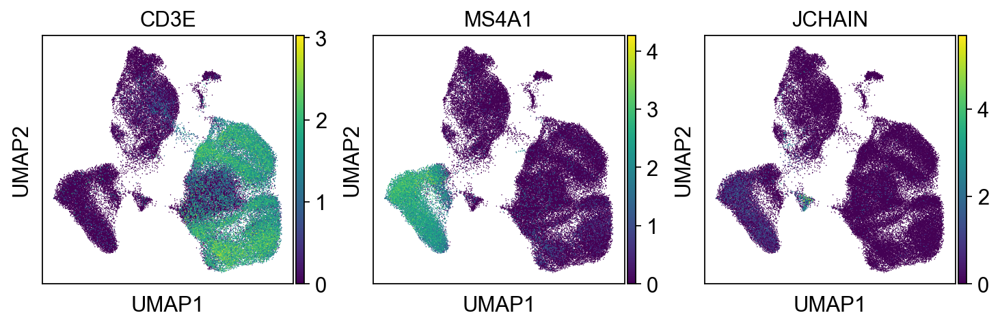

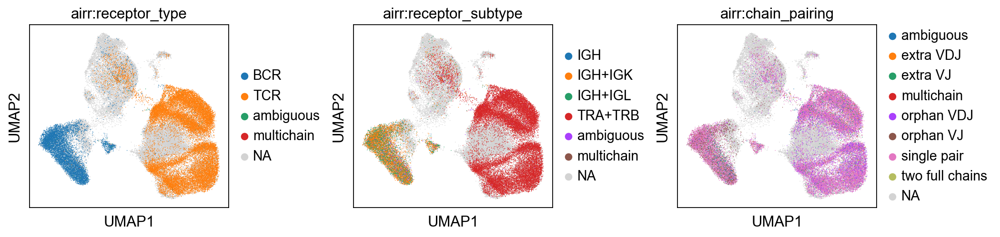

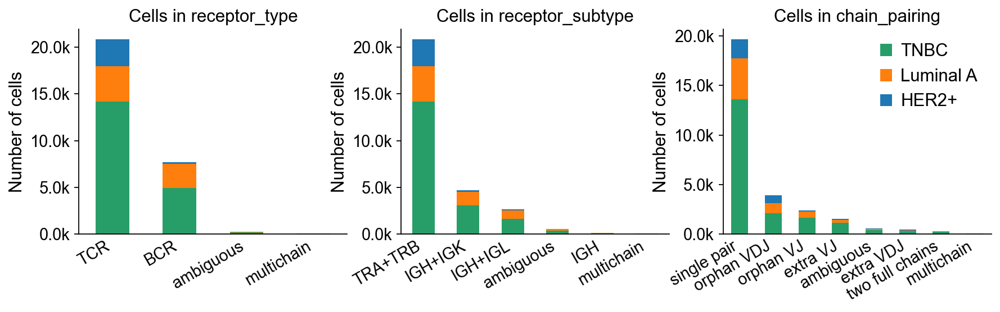

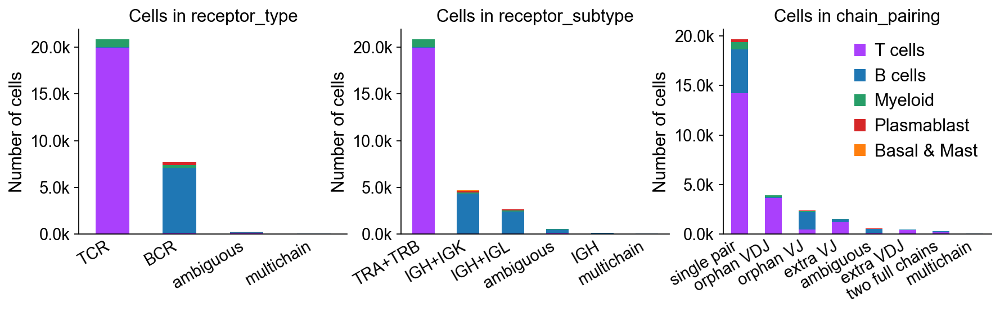

In [294]:
ir.pp.index_chains(bcmdata)
ir.tl.chain_qc(bcmdata)
figsize=(11,3)

# GENE EXPRESSION OF T,B cells
fig, ax = plt.subplots(1, 3,figsize=figsize)
for i,g in enumerate(["CD3E", 'MS4A1', 'JCHAIN']):
  mu.pl.embedding(bcmdata, basis="gex:umap", color=g, ax=ax[i], show=False)
  ax[i].set_xlabel("UMAP1")
  ax[i].set_ylabel("UMAP2")
fig.savefig(f"{figPath}/bcm-umap-expr.png", dpi=300, bbox_inches='tight')

# umap of TCR,BCR 
fig, ax = plt.subplots(1, 3,figsize=(13,3), constrained_layout=True)
for i,g in enumerate(["airr:receptor_type", "airr:receptor_subtype", 'airr:chain_pairing']):
  mu.pl.embedding(bcmdata, basis="gex:umap", color=g, ax=ax[i], show=False)
  ax[i].set_xlabel("UMAP1")
  ax[i].set_ylabel("UMAP2")
fig.savefig(f"{figPath}/bcm-umap-tbcr.png", dpi=300, bbox_inches='tight')

# abundance of TCR,BCR targeting molecular_type
def ks(x, pos):
    return '%1.1fk' % (x*1e-3)
fig, ax = plt.subplots(1, 3,figsize=(13,3))
for i,g in enumerate(["airr:receptor_type", "airr:receptor_subtype", 'airr:chain_pairing']):
  ir.pl.group_abundance(bcmdata, groupby=g, 
                        target_col="gex:molecular_type", 
                        ax=ax[i], 
                        style_kws={"title": "Cells in {}".format(g.split(":")[1]),
                                   "xlab": '',
                                   "title_fontsize":14, 
                                   "label_fontsize":14, 
                                   "tick_fontsize":13,
                                   "add_legend": True})
  ax[i].yaxis.set_major_formatter(FuncFormatter(ks))
ax[2].legend(fontsize=14,
      frameon=False, handletextpad=0.5, loc="best",
              borderpad=0.3,
              columnspacing=1.3,
              handlelength=0.65,)
fig.savefig(f"{figPath}/bcm-abundance-tbcr-molecular.png", dpi=300, bbox_inches='tight')

# abundance of TCR,BCR targeting major_type
fig, ax = plt.subplots(1, 3,figsize=(13,3))
for i,g in enumerate(["airr:receptor_type", "airr:receptor_subtype", 'airr:chain_pairing']):
  ir.pl.group_abundance(bcmdata, groupby=g, 
                        target_col="gex:major-type", 
                        ax=ax[i], 
                        style_kws={"title": "Cells in {}".format(g.split(":")[1]),
                                   "xlab": '',
                                   "title_fontsize":14, 
                                   "label_fontsize":14, 
                                   "tick_fontsize":13,
                                   "add_legend": True})
  ax[i].yaxis.set_major_formatter(FuncFormatter(ks))
ax[2].legend(fontsize=14,
      frameon=False, handletextpad=0.5, loc="best",
              borderpad=0.3,
              columnspacing=1.3,
              handlelength=0.65,)
fig.savefig(f"{figPath}/bcm-abundance-tbcr-major.png", dpi=300, bbox_inches='tight')

In [295]:
# merge cells in BCY and BCM
common_vars = pd.unique(bcy_preF.var_names.intersection(bcm_preF.var_names))
bcy_preF.obs['sample']=bcy_preF.obs['batch']
bcm_preF.obs['sample']=bcm_preF.obs['batch']
bcy_preF.obs['major-type']=bcy_preF.obs['majorType-fix']
data_preF = bcy_preF[:, common_vars].concatenate(bcm_preF, batch_categories=['Young', 'Middle'])
data_preF

AnnData object with n_obs × n_vars = 248444 × 19680
    obs: 'batch', 'mt_frac', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'n_genes', 'n_counts', 'leiden', 'major_type', 'molecular_type', 'leiden_harmony', 'major_type_harmony', 'minor_type', 'minor-type', 'gender', 'doublet_score', 'predicted_doublet', 'leiden-harmony-female', 'majorType-Female', 'epi-subtype', 'majorType-fix', 'sample', 'major-type', 'leiden-major'
    var: 'n_cells_by_counts-Middle', 'mean_counts-Middle', 'log1p_mean_counts-Middle', 'pct_dropout_by_counts-Middle', 'total_counts-Middle', 'log1p_total_counts-Middle', 'n_cells-Middle', 'highly_variable-Middle', 'means-Middle', 'dispersions-Middle', 'dispersions_norm-Middle', 'ID-Middle', 'name-Middle', 'type-Middle', 'n_cells_by_counts-Young', 'mean_counts-Young', 'log1p_mean_counts-Young', 'pct_dropout_by_counts-Young', 'total_counts-Young', 'log1p_total_counts-Young', 'n_cells-Young', 'highly_variable-Young', 'means-Young', 

In [296]:
data_ir = ir.pp.merge_airr(bcy_ir, bcm_ir)
data_ir

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

AnnData object with n_obs × n_vars = 72266 × 0
    obs: 'chain_pairing', 'receptor_subtype', 'receptor_type'
    uns: 'scirpy_version'
    obsm: 'airr'

In [299]:
data_T = data_preF[data_preF.obs['major-type'].isin(["T cells"]), :]
data_T.obs_names = [f"{s.split('-')[0]}-1-{s.split('-')[2]}" for s in data_T.obs_names]
data_T.obs_names_make_unique()
ir_T = data_ir[data_ir.obs_names.isin(data_T.obs_names)]
ir_T.obs_names_make_unique()
mdata_T = mu.MuData({'gex': data_T, "airr":ir_T})
mdata_T

MuData object with n_obs × n_vars = 86822 × 19680
  2 modalities
    gex:	86822 x 19680
      obs:	'batch', 'mt_frac', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'n_genes', 'n_counts', 'leiden', 'major_type', 'molecular_type', 'leiden_harmony', 'major_type_harmony', 'minor_type', 'minor-type', 'gender', 'doublet_score', 'predicted_doublet', 'leiden-harmony-female', 'majorType-Female', 'epi-subtype', 'majorType-fix', 'sample', 'major-type', 'leiden-major'
      var:	'n_cells_by_counts-Middle', 'mean_counts-Middle', 'log1p_mean_counts-Middle', 'pct_dropout_by_counts-Middle', 'total_counts-Middle', 'log1p_total_counts-Middle', 'n_cells-Middle', 'highly_variable-Middle', 'means-Middle', 'dispersions-Middle', 'dispersions_norm-Middle', 'ID-Middle', 'name-Middle', 'type-Middle', 'n_cells_by_counts-Young', 'mean_counts-Young', 'log1p_mean_counts-Young', 'pct_dropout_by_counts-Young', 'total_counts-Young', 'log1p_total_counts-Young', 'n_cells-Young', 'highly_variable-Young', 'means-Young', 'dispersions-Young', 'dispersions_norm-Young'
      obsm:	'X_pca', 'X_pca_harmony', 'X_umap'
    airr:	47799 x 0
      obs:	'chain_pairing', 'receptor_subtype', 'receptor_type'
      uns:	'scirpy_version'
      obsm:	'airr'

In [301]:
data_B = data_preF[data_preF.obs['major-type'].isin(["B cells", "Plasmablast"]), :]
data_B.obs_names = [f"{s.split('-')[0]}-1-{s.split('-')[2]}" for s in data_B.obs_names]
data_B.obs_names_make_unique()
ir_B = data_ir[data_ir.obs_names.isin(data_B.obs_names)]
ir_B.obs_names_make_unique()
mdata_B = mu.MuData({'gex': data_B, "airr":ir_B})
mdata_B 

MuData object with n_obs × n_vars = 21755 × 19680
  2 modalities
    gex:	21755 x 19680
      obs:	'batch', 'mt_frac', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'n_genes', 'n_counts', 'leiden', 'major_type', 'molecular_type', 'leiden_harmony', 'major_type_harmony', 'minor_type', 'minor-type', 'gender', 'doublet_score', 'predicted_doublet', 'leiden-harmony-female', 'majorType-Female', 'epi-subtype', 'majorType-fix', 'sample', 'major-type', 'leiden-major'
      var:	'n_cells_by_counts-Middle', 'mean_counts-Middle', 'log1p_mean_counts-Middle', 'pct_dropout_by_counts-Middle', 'total_counts-Middle', 'log1p_total_counts-Middle', 'n_cells-Middle', 'highly_variable-Middle', 'means-Middle', 'dispersions-Middle', 'dispersions_norm-Middle', 'ID-Middle', 'name-Middle', 'type-Middle', 'n_cells_by_counts-Young', 'mean_counts-Young', 'log1p_mean_counts-Young', 'pct_dropout_by_counts-Young', 'total_counts-Young', 'log1p_total_counts-Young', 'n_cells-Young', 'highly_variable-Young', 'means-Young', 'dispersions-Young', 'dispersions_norm-Young'
      obsm:	'X_pca', 'X_pca_harmony', 'X_umap'
    airr:	12855 x 0
      obs:	'chain_pairing', 'receptor_subtype', 'receptor_type'
      uns:	'scirpy_version'
      obsm:	'airr'

In [302]:
mdata_T.write("mdata-T1.h5mu")
mdata_B.write("mdata-B1.h5mu")

... storing 'chain_pairing' as categorical
... storing 'receptor_subtype' as categorical
... storing 'receptor_type' as categorical
... storing 'chain_pairing' as categorical
... storing 'receptor_subtype' as categorical
... storing 'receptor_type' as categorical


In [303]:
def clu(adata, key_added, n_neighbors=50, n_pcs=30, rep='X_pca_harmony', do_har=False, max_iter=20, resolution=1, do_scrublet=True, har_key='batch'):
    # Computing the neighborhood graph
    if do_scrublet:
        n0 = adata.shape[0]
        print("{0} Cell number: {1}".format(key_added, n0))
        sc.external.pp.scrublet(adata, random_state=112)
        adata = adata[adata.obs['predicted_doublet']==False,:].copy()
        print("{0} Cells retained after scrublet, {1} cells reomved.".format(adata.shape[0], n0-adata.shape[0]))
    else:
        print("Ignoring processing doublet cells...")
    sc.tl.pca(adata, svd_solver='arpack')
    if do_har:
        sc.external.pp.harmony_integrate(adata, key='batch',max_iter_harmony=max_iter)
    sc.pp.neighbors(adata, n_neighbors=n_neighbors, n_pcs=n_pcs, use_rep=rep)
    # Run UMAP
    sc.tl.umap(adata)
    sc.tl.leiden(adata, key_added=key_added, resolution=resolution)
    sc.pl.umap(adata, color=key_added, legend_fontoutline=True, palette=sc.pl.palettes.default_20, legend_loc="on data")
    return adata

def marker(adata, groupby, method='wilcoxon', prefix=''):
    sc.tl.rank_genes_groups(adata, groupby = groupby, method = method)
    sc.tl.dendrogram(adata, groupby=groupby, use_rep='X_pca_harmony')
    sc.pl.rank_genes_groups_dotplot(adata, groupby = groupby, save=prefix+groupby+'.svg')
    return adata

Ignoring processing doublet cells...
computing PCA
    with n_comps=50
    finished (0:01:58)


2024-04-08 13:52:25,224 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
Computing initial centroids with sklearn.KMeans...
2024-04-08 13:54:15,674 - harmonypy - INFO - sklearn.KMeans initialization complete.
sklearn.KMeans initialization complete.
2024-04-08 13:54:16,238 - harmonypy - INFO - Iteration 1 of 20
Iteration 1 of 20
2024-04-08 13:54:36,541 - harmonypy - INFO - Iteration 2 of 20
Iteration 2 of 20
2024-04-08 13:54:56,481 - harmonypy - INFO - Converged after 2 iterations
Converged after 2 iterations


computing neighbors
    finished (0:00:20)
computing UMAP
    finished (0:00:47)
running Leiden clustering
    finished (0:01:17)


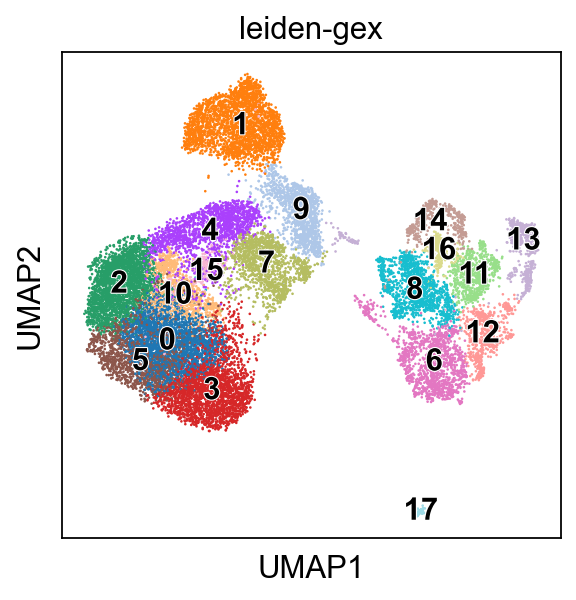

AnnData object with n_obs × n_vars = 21755 × 19680
    obs: 'batch', 'mt_frac', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'n_genes', 'n_counts', 'leiden', 'major_type', 'molecular_type', 'leiden_harmony', 'major_type_harmony', 'minor_type', 'minor-type', 'gender', 'doublet_score', 'predicted_doublet', 'leiden-harmony-female', 'majorType-Female', 'epi-subtype', 'majorType-fix', 'sample', 'major-type', 'leiden-major', 'leiden-gex'
    var: 'n_cells_by_counts-Middle', 'mean_counts-Middle', 'log1p_mean_counts-Middle', 'pct_dropout_by_counts-Middle', 'total_counts-Middle', 'log1p_total_counts-Middle', 'n_cells-Middle', 'highly_variable-Middle', 'means-Middle', 'dispersions-Middle', 'dispersions_norm-Middle', 'ID-Middle', 'name-Middle', 'type-Middle', 'n_cells_by_counts-Young', 'mean_counts-Young', 'log1p_mean_counts-Young', 'pct_dropout_by_counts-Young', 'total_counts-Young', 'log1p_total_counts-Young', 'n_cells-Young', 'highly_variable-Young', 'm

In [304]:
clu(mdata_B['gex'], key_added="leiden-gex",do_har=True, do_scrublet=False)

... storing 'airr:chain_pairing' as categorical
... storing 'airr:receptor_subtype' as categorical
... storing 'airr:receptor_type' as categorical
... storing 'gex:B-subtype' as categorical


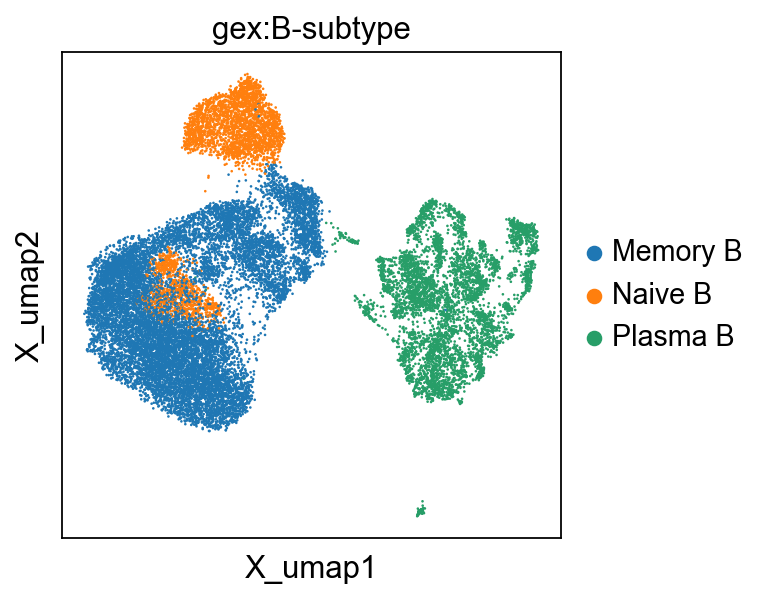

In [331]:
mdata_B.obs['gex:B-subtype'] = "Memory B"
mdata_B.obs['gex:leiden-gex'] = mdata_B['gex'].obs['leiden-gex']
mdata_B.obs.loc[mdata_B.obs['gex:leiden-gex'].isin(['1', '10']), 'gex:B-subtype'] = "Naive B"
mdata_B.obs.loc[mdata_B.obs['gex:leiden-gex'].isin(['6', '8', '11', '12', '13', '14', '16', '17']), 'gex:B-subtype'] = "Plasma B"
mu.pl.embedding(mdata_B, basis='gex:umap', color='gex:B-subtype')

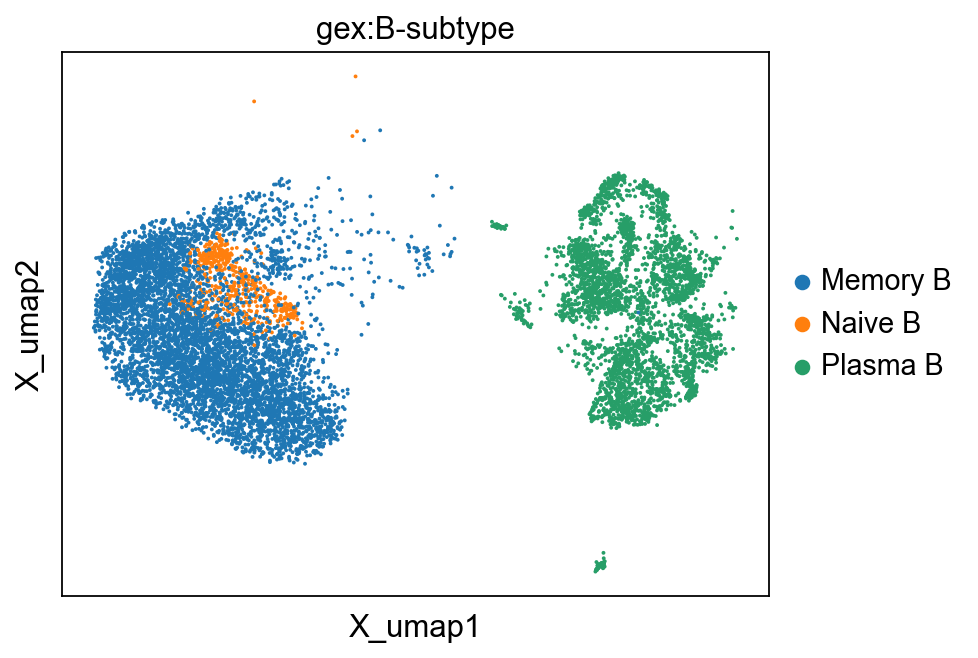

In [384]:
fig, ax = plt.subplots(figsize=(6,4), constrained_layout=True)
mu.pl.embedding(mdata_B, basis='gex:umap', color='gex:B-subtype', ax=ax)
fig.savefig(f'{figPath}/B-umap-ct.png', dpi=300)

Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.


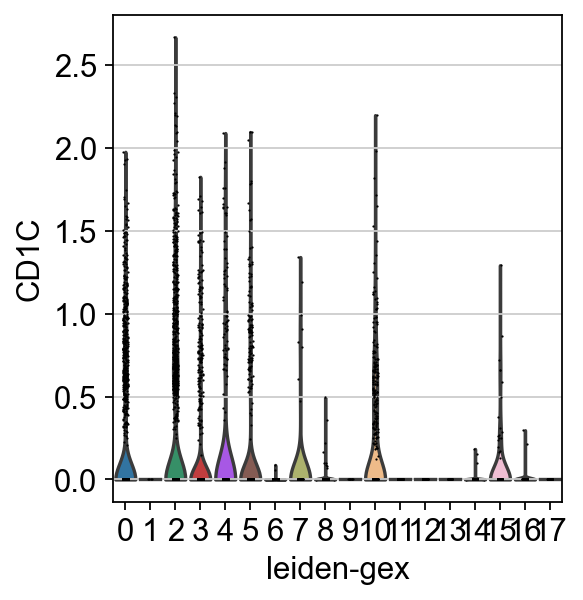

In [373]:
mdata_B['gex'].obs['B-subtype'] = mdata_B.obs['gex:B-subtype']
sc.pl.violin(mdata_B['gex'], keys='CD1C', groupby='leiden-gex')

In [365]:
mdata_B['gex']

AnnData object with n_obs × n_vars = 10008 × 19680
    obs: 'batch', 'mt_frac', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'n_genes', 'n_counts', 'leiden', 'major_type', 'molecular_type', 'leiden_harmony', 'major_type_harmony', 'minor_type', 'minor-type', 'gender', 'doublet_score', 'predicted_doublet', 'leiden-harmony-female', 'majorType-Female', 'epi-subtype', 'majorType-fix', 'sample', 'major-type', 'leiden-major', 'leiden-gex'
    var: 'n_cells_by_counts-Middle', 'mean_counts-Middle', 'log1p_mean_counts-Middle', 'pct_dropout_by_counts-Middle', 'total_counts-Middle', 'log1p_total_counts-Middle', 'n_cells-Middle', 'highly_variable-Middle', 'means-Middle', 'dispersions-Middle', 'dispersions_norm-Middle', 'ID-Middle', 'name-Middle', 'type-Middle', 'n_cells_by_counts-Young', 'mean_counts-Young', 'log1p_mean_counts-Young', 'pct_dropout_by_counts-Young', 'total_counts-Young', 'log1p_total_counts-Young', 'n_cells-Young', 'highly_variable-Young', 'm

... storing 'airr:chain_pairing' as categorical
... storing 'airr:receptor_subtype' as categorical
... storing 'airr:receptor_type' as categorical


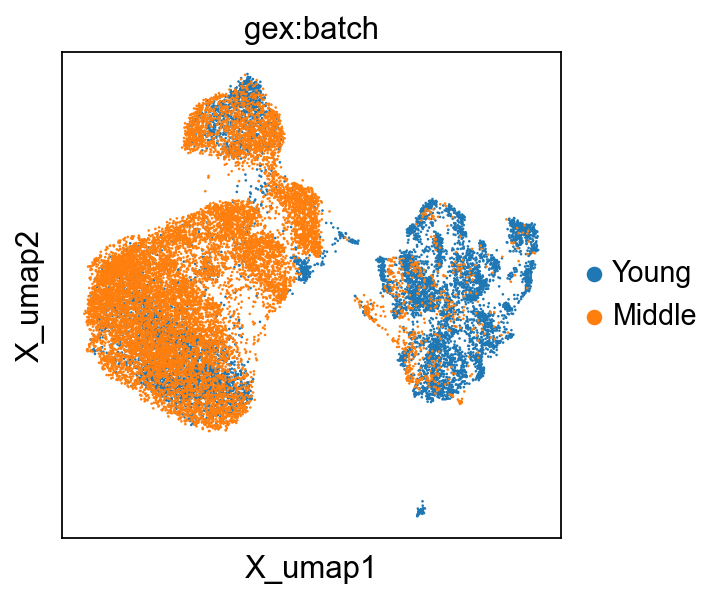

In [306]:
mu.pl.embedding(mdata_B, basis="gex:umap", color='gex:batch')

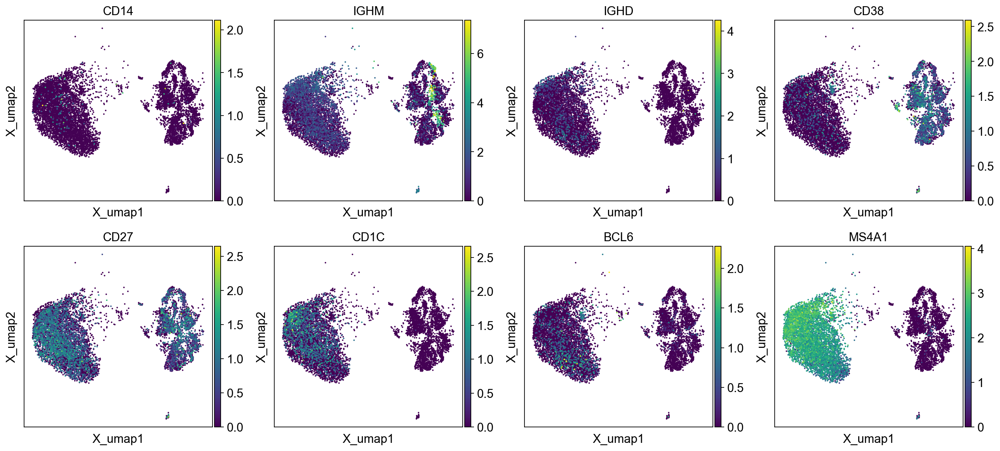

In [371]:
mu.pl.embedding(mdata_B, basis="gex:umap", color=['IGHM', 'CD38', 'CD27', 'CD1C', 'BCL6', 'MS4A1'])

In [328]:
mdata_B.write_h5mu("mdata-B1.h5mu")

/home/rzh/BCY/lib/python3.10/site-packages/anndata/_core/anndata.py:1292: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[key] = c
... storing 'gex:B-subtype' as categorical


ranking genes
    finished (0:00:46)
Storing dendrogram info using `.uns['dendrogram_leiden-gex']`


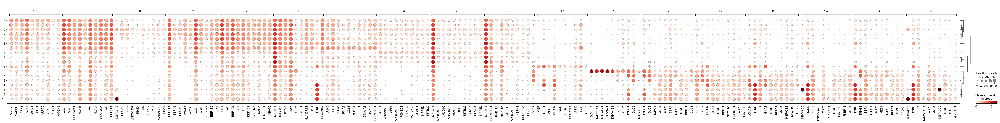

AnnData object with n_obs × n_vars = 21755 × 19680
    obs: 'batch', 'mt_frac', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'n_genes', 'n_counts', 'leiden', 'major_type', 'molecular_type', 'leiden_harmony', 'major_type_harmony', 'minor_type', 'minor-type', 'gender', 'doublet_score', 'predicted_doublet', 'leiden-harmony-female', 'majorType-Female', 'epi-subtype', 'majorType-fix', 'sample', 'major-type', 'leiden-major', 'leiden-gex'
    var: 'n_cells_by_counts-Middle', 'mean_counts-Middle', 'log1p_mean_counts-Middle', 'pct_dropout_by_counts-Middle', 'total_counts-Middle', 'log1p_total_counts-Middle', 'n_cells-Middle', 'highly_variable-Middle', 'means-Middle', 'dispersions-Middle', 'dispersions_norm-Middle', 'ID-Middle', 'name-Middle', 'type-Middle', 'n_cells_by_counts-Young', 'mean_counts-Young', 'log1p_mean_counts-Young', 'pct_dropout_by_counts-Young', 'total_counts-Young', 'log1p_total_counts-Young', 'n_cells-Young', 'highly_variable-Young', 'm

In [309]:
marker(mdata_B['gex'], groupby="leiden-gex", method='wilcoxon', prefix='BCM')

Filtering chains...
Indexing VJ chains...
Indexing VDJ chains...
build result array
Stored result in `mdata.obs["airr:receptor_type"]`.
Stored result in `mdata.obs["airr:receptor_subtype"]`.
Stored result in `mdata.obs["airr:chain_pairing"]`.


... storing 'airr:chain_pairing' as categorical
... storing 'airr:receptor_subtype' as categorical
... storing 'airr:receptor_type' as categorical
... storing 'gex:B-subtype' as categorical
... storing 'airr:chain_pairing' as categorical
... storing 'airr:receptor_subtype' as categorical
... storing 'airr:receptor_type' as categorical
... storing 'gex:B-subtype' as categorical
... storing 'airr:chain_pairing' as categorical
... storing 'airr:receptor_subtype' as categorical
... storing 'airr:receptor_type' as categorical
... storing 'gex:B-subtype' as categorical


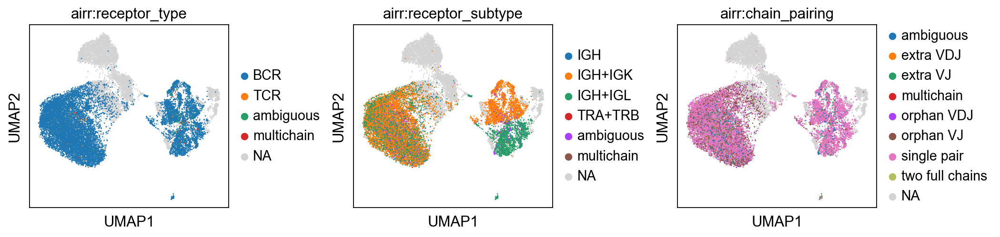

In [329]:
ir.pp.index_chains(mdata_B)
ir.tl.chain_qc(mdata_B)
# umap of TCR,BCR 
fig, ax = plt.subplots(1, 3,figsize=(13,3), constrained_layout=True)
for i,g in enumerate(["airr:receptor_type", "airr:receptor_subtype", 'airr:chain_pairing']):
  mu.pl.embedding(mdata_B, basis="gex:umap", color=g, ax=ax[i], show=False)
  ax[i].set_xlabel("UMAP1")
  ax[i].set_ylabel("UMAP2")
fig.savefig(f"{figPath}/B-umap-bcr.png", dpi=300, bbox_inches='tight')

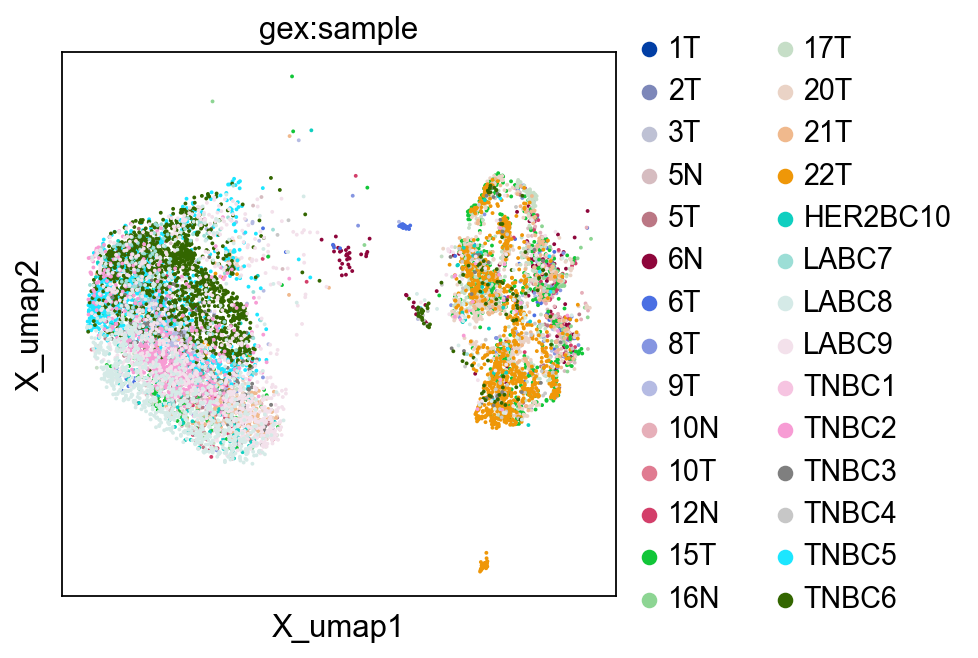

In [375]:
fig, ax = plt.subplots(figsize=(6,4), constrained_layout=True)
mu.pl.embedding(mdata_B, basis='gex:umap', color='gex:sample', ax=ax, show=False)
fig.savefig(f'{figPath}/B-umap-sample.png', dpi=300)

... storing 'airr:chain_pairing' as categorical
... storing 'airr:receptor_subtype' as categorical
... storing 'airr:receptor_type' as categorical
... storing 'gex:B-subtype' as categorical
... storing 'airr:chain_pairing' as categorical
... storing 'airr:receptor_subtype' as categorical
... storing 'airr:receptor_type' as categorical
... storing 'gex:B-subtype' as categorical
... storing 'airr:chain_pairing' as categorical
... storing 'airr:receptor_subtype' as categorical
... storing 'airr:receptor_type' as categorical
... storing 'gex:B-subtype' as categorical


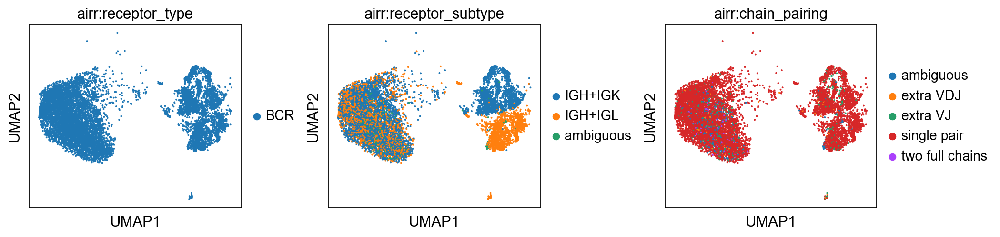

In [333]:
mu.pp.filter_obs(data=mdata_B, var="airr:receptor_type", func= lambda x: x == "BCR")
mu.pp.filter_obs(data=mdata_B, var="airr:chain_pairing", func= lambda x: ~np.isin(x,["orphan VDJ", 'orphan VJ']))
fig, ax = plt.subplots(1, 3,figsize=(13,3), constrained_layout=True)
for i,g in enumerate(["airr:receptor_type", "airr:receptor_subtype", 'airr:chain_pairing']):
  mu.pl.embedding(mdata_B, basis="gex:umap", color=g, ax=ax[i], show=False)
  ax[i].set_xlabel("UMAP1")
  ax[i].set_ylabel("UMAP2")
fig.savefig(f"{figPath}/B-umap-bcr.png", dpi=300, bbox_inches='tight')

... storing 'airr:chain_pairing' as categorical
... storing 'airr:receptor_subtype' as categorical
... storing 'airr:receptor_type' as categorical
... storing 'gex:B-subtype' as categorical


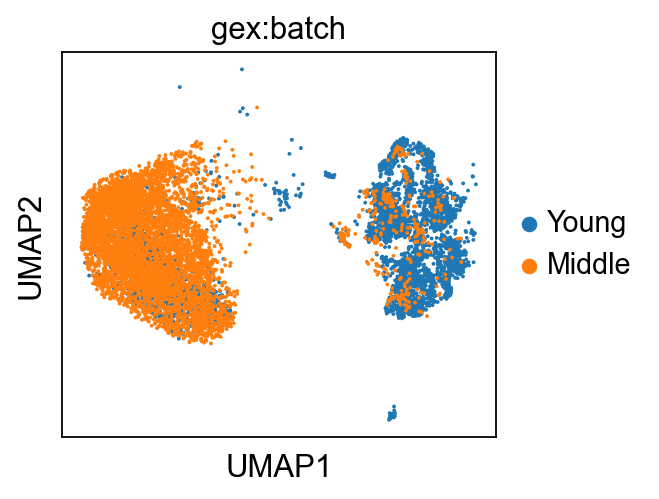

In [334]:
fig, ax = plt.subplots(1, 1,figsize=(4,3), constrained_layout=True)
mu.pl.embedding(mdata_B, basis="gex:umap", color="gex:batch", ax=ax, show=False)
ax.set_xlabel("UMAP1")
ax.set_ylabel("UMAP2")
fig.savefig(f"{figPath}/B-umap-batch.png", dpi=300, bbox_inches='tight')

Computing sequence x sequence distance matrix for VJ sequences.
Computing sequence x sequence distance matrix for VDJ sequences.
Initializing lookup tables. 
Computing clonotype x clonotype distances.
NB: Computation happens in chunks. The progressbar only advances when a chunk has finished. 


  0%|          | 0/8748 [00:02<?, ?it/s]

Stored result in `mdata.obs["airr:clone_id"]`.
Stored result in `mdata.obs["airr:clone_id_size"]`.


... storing 'airr:clone_id' as categorical
... storing 'clone_id' as categorical


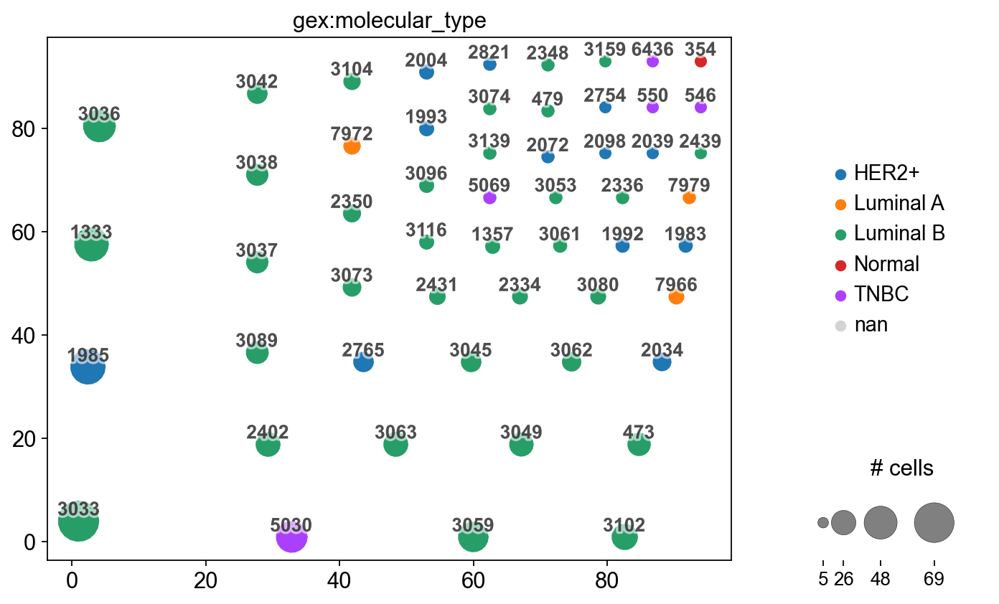

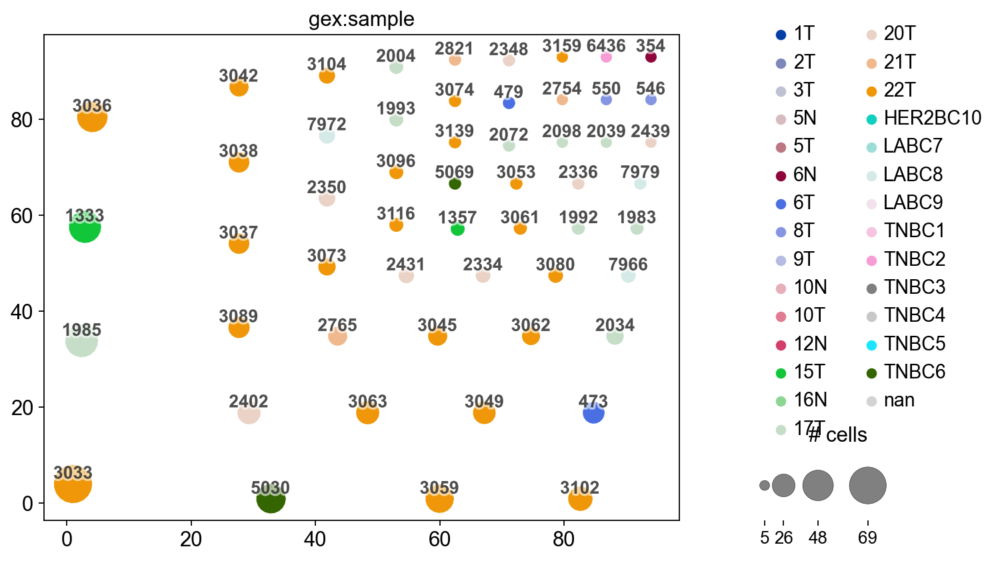

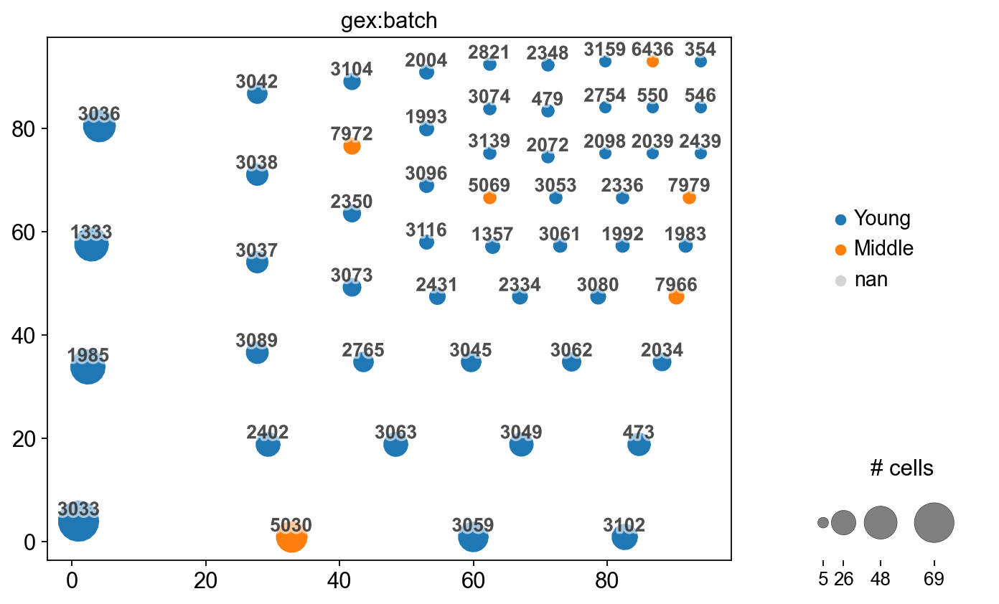

In [376]:
ir.pp.ir_dist(mdata_B, metric="identity", sequence="aa", key_added="ir_dist_aa_identity", n_jobs=16)
ir.tl.define_clonotypes(mdata_B, key_added="clone_id", same_v_gene=False, dual_ir='primary_only',receptor_arms="all" )
ir.tl.clonotype_network(mdata_B, min_cells=5)
ir.pl.clonotype_network(mdata_B, color='gex:molecular_type',label_fontsize=12,panel_size=(7, 6),base_size=9).figure.savefig(f"{figPath}/B_network_molecular_type.svg")
ir.pl.clonotype_network(mdata_B, color='gex:sample',label_fontsize=12,panel_size=(7, 6),base_size=9).figure.savefig(f"{figPath}/B_network_sample.svg")
ir.pl.clonotype_network(mdata_B, color='gex:batch',label_fontsize=12,panel_size=(7, 6),base_size=9).figure.savefig(f"{figPath}/B_network_batch.svg")

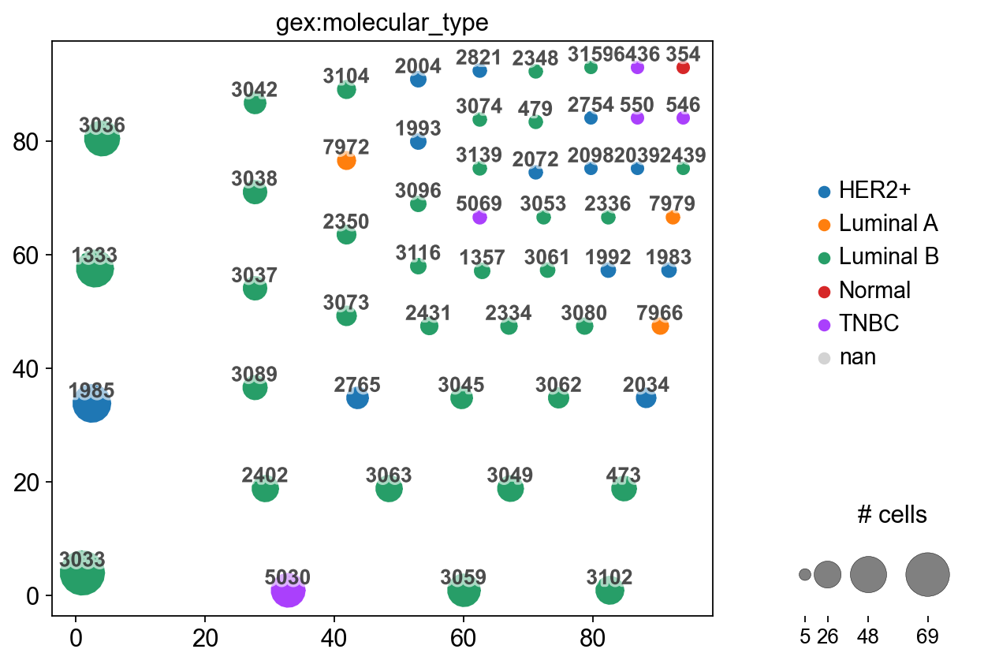

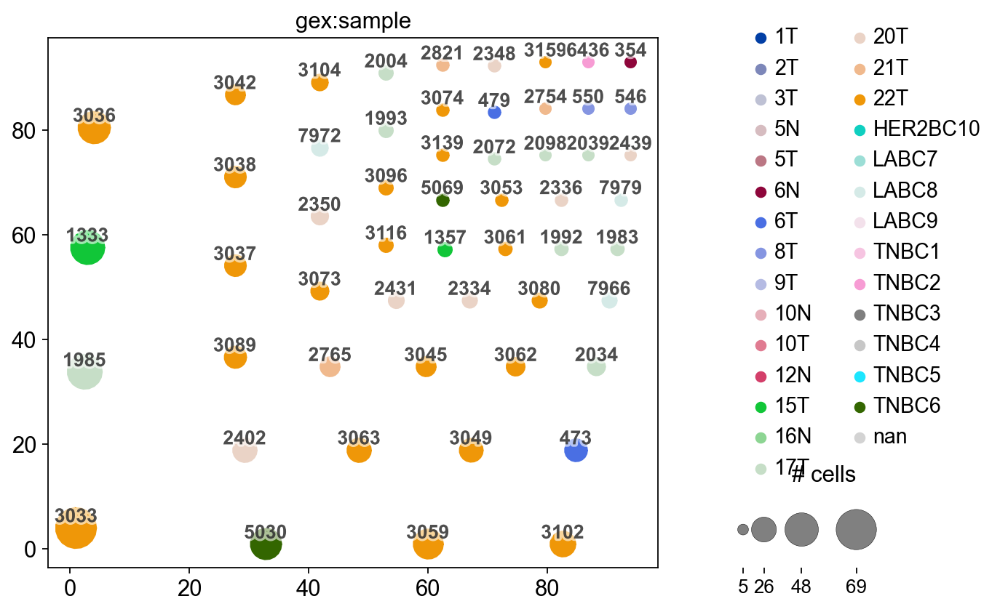

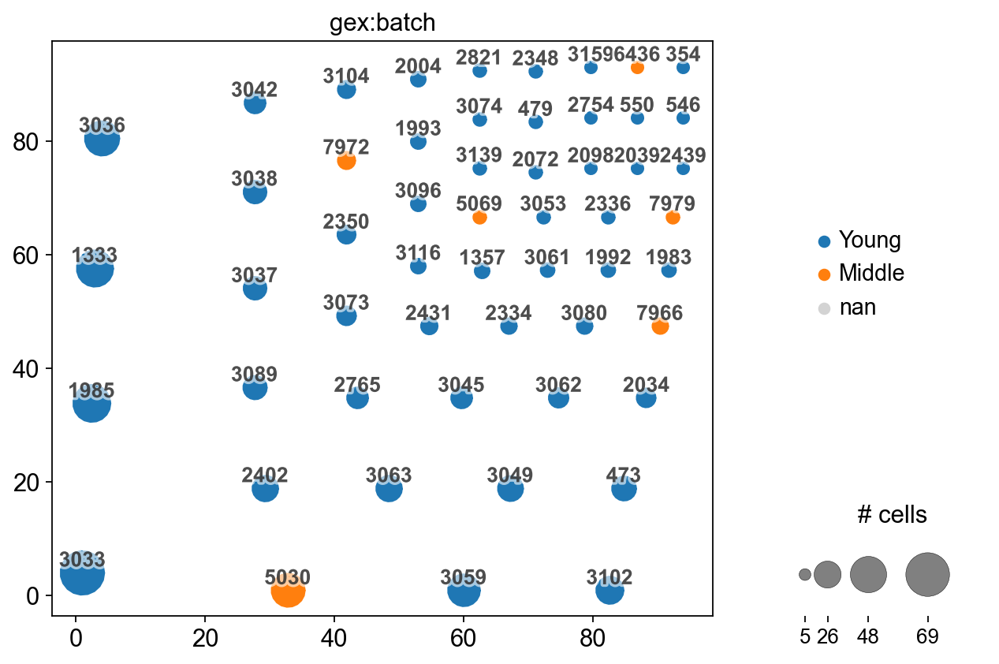

In [377]:
ir.pl.clonotype_network(mdata_B, color='gex:molecular_type',label_fontsize=12,panel_size=(7, 6),base_size=9).figure.savefig(f"{figPath}/B_network_molecular_type.svg")
ir.pl.clonotype_network(mdata_B, color='gex:sample',label_fontsize=12,panel_size=(7, 6),base_size=9).figure.savefig(f"{figPath}/B_network_sample.svg")
ir.pl.clonotype_network(mdata_B, color='gex:batch',label_fontsize=12,panel_size=(7, 6),base_size=9).figure.savefig(f"{figPath}/B_network_batch.svg")

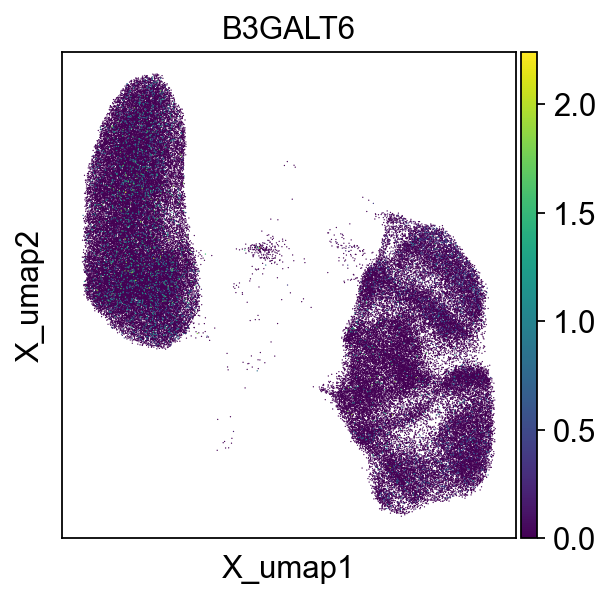

In [378]:
mu.pl.embedding(mdata_T, basis='gex:umap', color="B3GALT6")

In [386]:
ir.pp.ir_dist(mdata_B, metric="alignment", sequence="aa", cutoff=15)
ir.tl.define_clonotype_clusters(mdata_B, sequence="aa", metric="alignment", receptor_arms="all", dual_ir="any")
ir.tl.clonotype_network(mdata_B, min_cells=10, sequence="aa", metric="alignment")

Computing sequence x sequence distance matrix for VJ sequences.
block size set to 220


/home/rzh/BCY/lib/python3.10/site-packages/setuptools_scm/_integration/setuptools.py:30: RuntimeWarning: 
ERROR: setuptools==59.6.0 is used in combination with setuptools_scm>=8.x

Your build configuration is incomplete and previously worked by accident!
setuptools_scm requires setuptools>=61

Suggested workaround if applicable:
 - migrating from the deprecated setup_requires mechanism to pep517/518
   and using a pyproject.toml to declare build dependencies
   which are reliably pre-installed before running the build tools

  warnings.warn(


  0%|          | 0/528 [00:00<?, ?it/s]

/home/rzh/BCY/lib/python3.10/site-packages/setuptools_scm/_integration/setuptools.py:30: RuntimeWarning: 
ERROR: setuptools==59.6.0 is used in combination with setuptools_scm>=8.x

Your build configuration is incomplete and previously worked by accident!
setuptools_scm requires setuptools>=61

Suggested workaround if applicable:
 - migrating from the deprecated setup_requires mechanism to pep517/518
   and using a pyproject.toml to declare build dependencies
   which are reliably pre-installed before running the build tools

  warnings.warn(
/home/rzh/BCY/lib/python3.10/site-packages/setuptools_scm/_integration/setuptools.py:30: RuntimeWarning: 
ERROR: setuptools==59.6.0 is used in combination with setuptools_scm>=8.x

Your build configuration is incomplete and previously worked by accident!
setuptools_scm requires setuptools>=61

Suggested workaround if applicable:
 - migrating from the deprecated setup_requires mechanism to pep517/518
   and using a pyproject.toml to declare build de

Computing sequence x sequence distance matrix for VDJ sequences.
block size set to 279


  0%|          | 0/528 [00:00<?, ?it/s]

Initializing lookup tables. 
Computing clonotype x clonotype distances.
NB: Computation happens in chunks. The progressbar only advances when a chunk has finished. 


  0%|          | 0/8739 [00:00<?, ?it/s]

Stored result in `mdata.obs["airr:cc_aa_alignment"]`.
Stored result in `mdata.obs["airr:cc_aa_alignment_size"]`.


... storing 'airr:cc_aa_alignment' as categorical
... storing 'cc_aa_alignment' as categorical


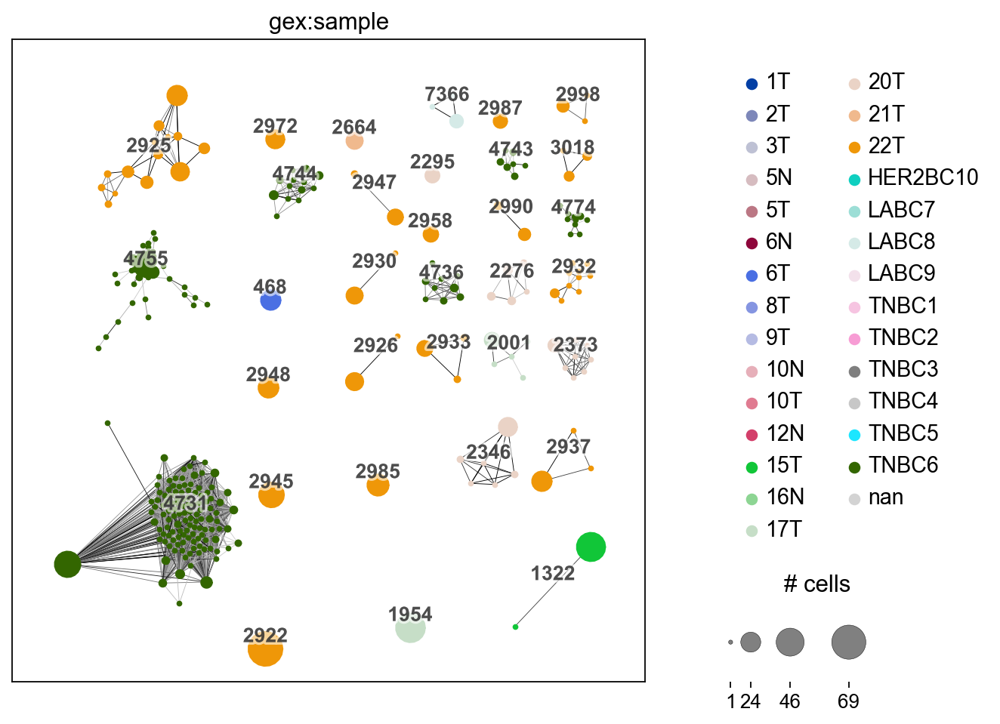

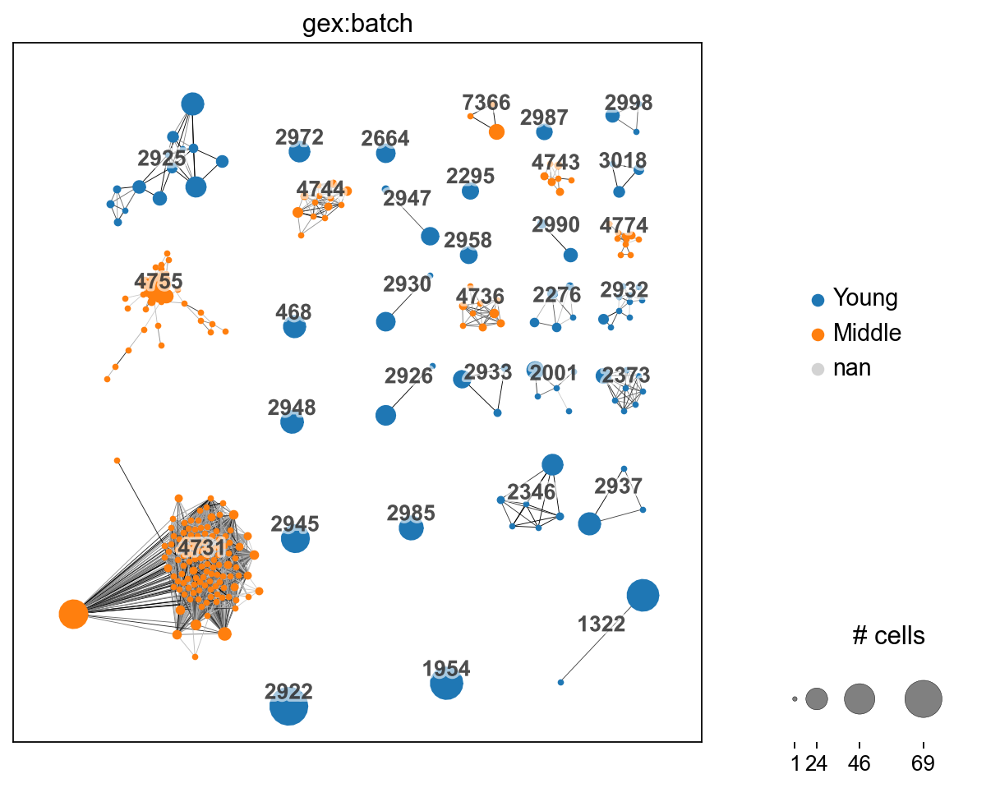

In [387]:
ir.pl.clonotype_network(mdata_B, color="gex:sample", label_fontsize=12, panel_size=(7,7), base_size=6).figure.savefig(f"{figPath}/B-clono_netcluster_sample.svg")
ir.pl.clonotype_network(mdata_B, color="gex:batch", label_fontsize=12, panel_size=(7,7), base_size=6).figure.savefig(f"{figPath}/clono_netcluster_batch.svg")

Stored result in `mdata.obs["airr:clonal_expansion"]`.


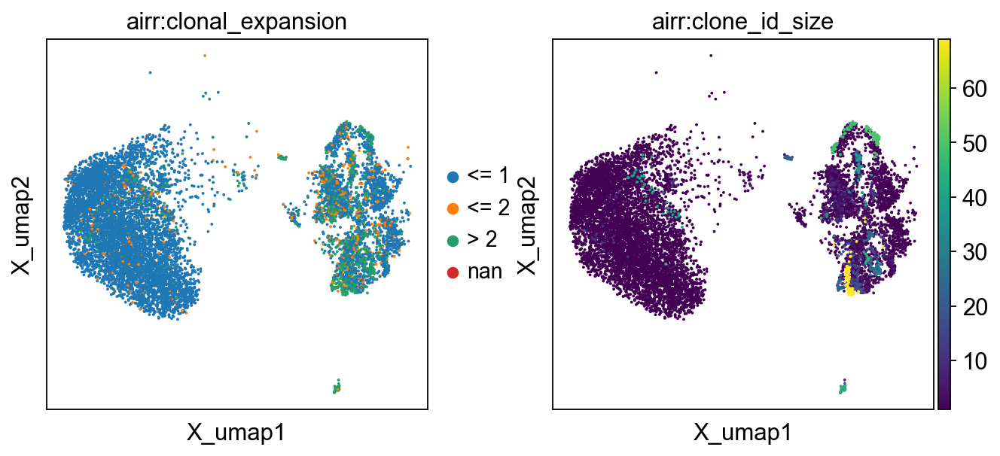

In [341]:
ir.tl.clonal_expansion(mdata_B)
mu.pl.embedding(mdata_B, basis="gex:umap", color=["airr:clonal_expansion", "airr:clone_id_size"])

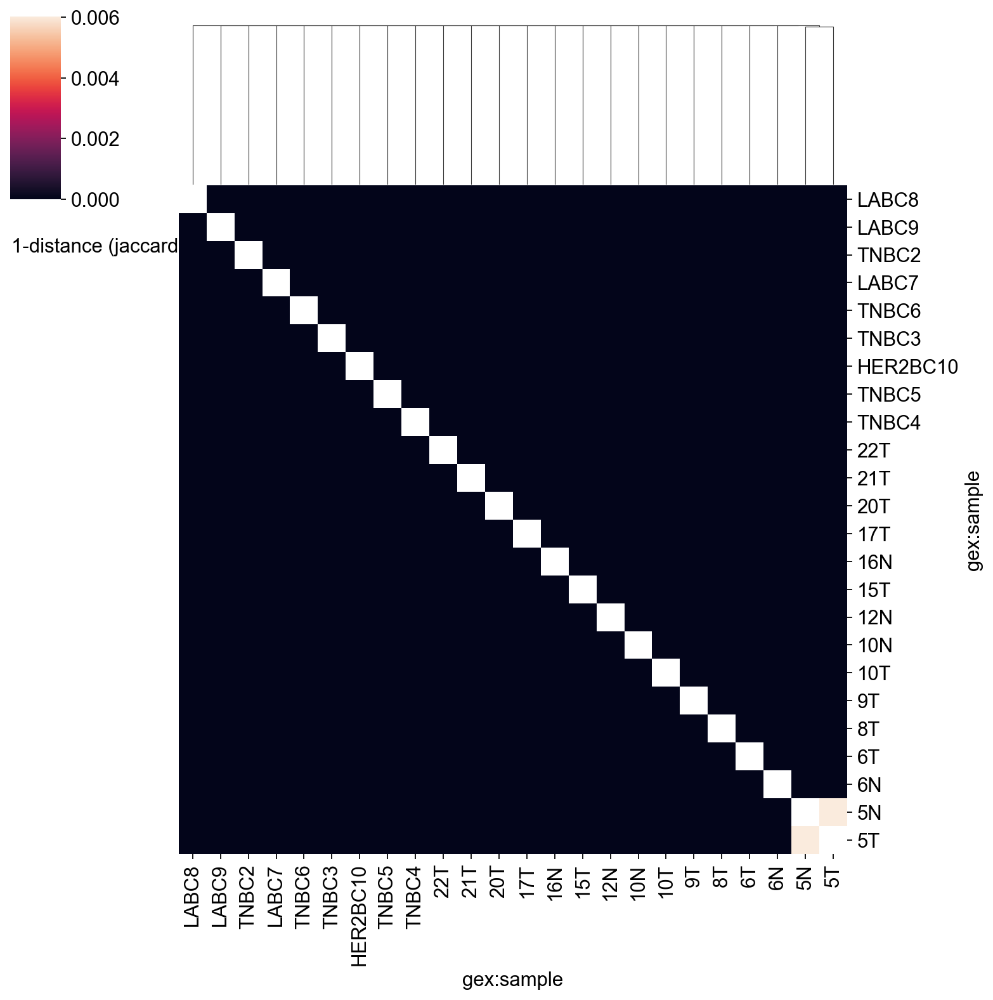

In [342]:
ir.tl.repertoire_overlap(mdata_B, groupby="gex:sample")
ir.pl.repertoire_overlap(mdata_B, groupby="gex:sample")

Initalizing clonotype subgraphs...


  0%|          | 0/8110 [00:00<?, ?it/s]

Computing background distributions...


  0%|          | 0/1000 [00:00<?, ?it/s]

Stored result in `mdata.obs["airr:clonotype_modularity"]`.
Stored result in `mdata.obs["airr:clonotype_modularity_fdr"]`.


<AxesSubplot: xlabel='modularity score', ylabel='-log10(FDR)'>

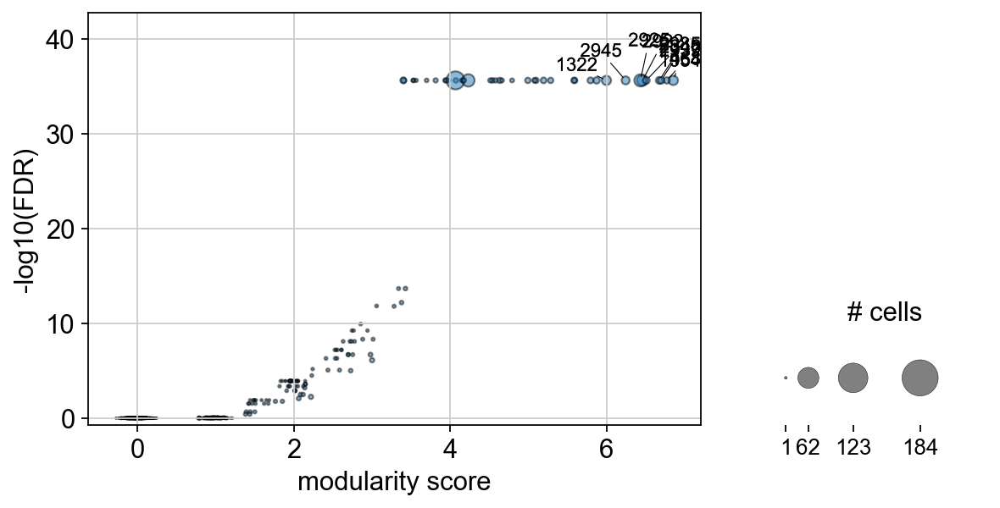

In [343]:
ir.tl.clonotype_modularity(mdata_B, target_col="airr:cc_aa_alignment")
ir.pl.clonotype_modularity(mdata_B)

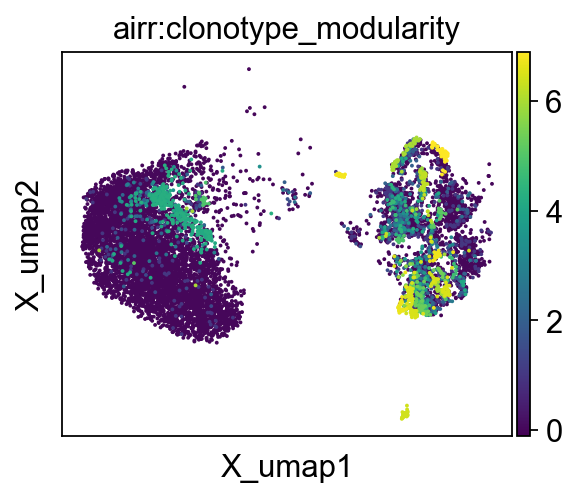

In [363]:
fig, ax = plt.subplots(figsize=(3.5, 3), constrained_layout=True)
mu.pl.embedding(mdata_B, basis="gex:umap", color="airr:clonotype_modularity", ax=ax)
ax.set_title("Clonotype Modularity")
ax.set_xlabel("UMAP1")
ax.set_ylabel("UMAP2")
fig.savefig(f"{figPath}/B-Clonotype-Modularity.png", dpi=300, bbox_inches="tight")

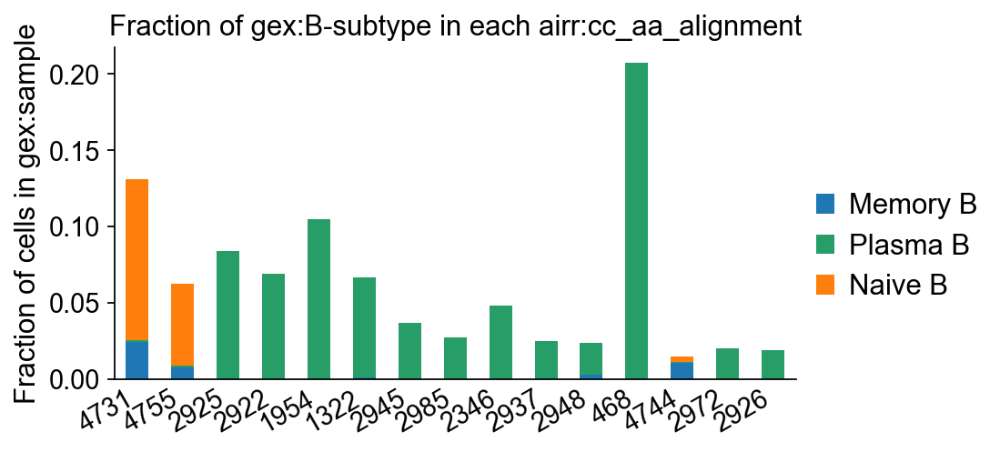

In [348]:
ax = ir.pl.group_abundance(mdata_B, groupby="airr:cc_aa_alignment", 
                      target_col="gex:B-subtype", 
                      max_cols=15,
                      fig_kws={"figsize":(6,3)},
                      normalize="gex:sample",
                      style_kws={
                                  "xlab": '',
                                  "title_fontsize":14, 
                                  "label_fontsize":14, 
                                  "tick_fontsize":13,
                                  "add_legend": True})
ax.legend(fontsize=14,
      frameon=False, handletextpad=0.5, loc="right",bbox_to_anchor=(1.3,0.4),ncols=1,
              borderpad=0.3,
              columnspacing=1.3,
              handlelength=0.65,)
ax.figure.savefig(f"{figPath}/abundance_alignment_cluster.svg", bbox_inches="tight")

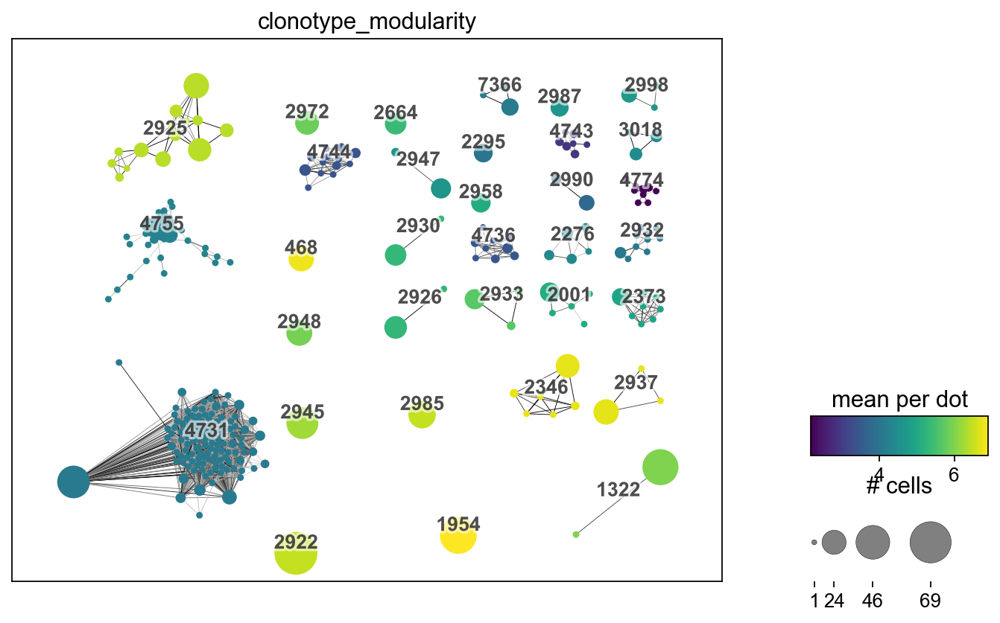

In [360]:
ir.pl.clonotype_network(
    mdata_B,
    color="clonotype_modularity",
    label_fontsize=12,
    panel_size=(8, 6),
    base_size=9,
).figure.savefig(f"{figPath}/B_clonotype_modularity.png", dpi=300)

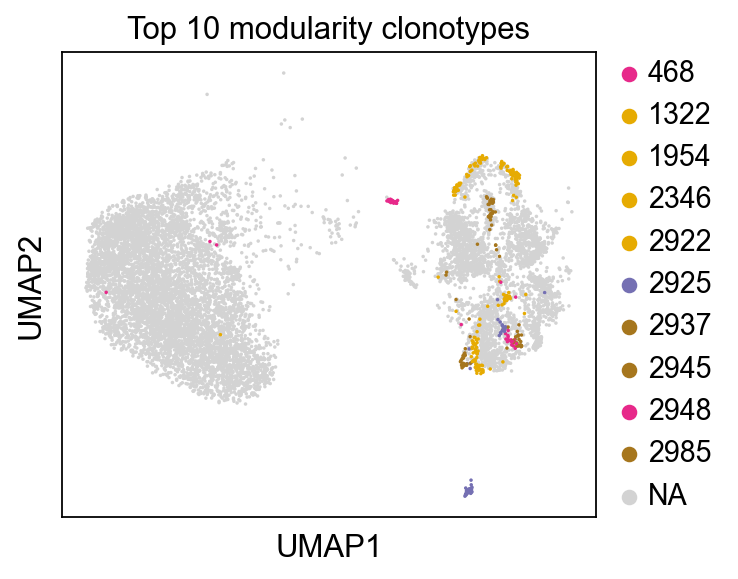

In [355]:
clonotypes_top_modularity = list(
    mdata_B.obs.set_index("airr:cc_aa_alignment")["airr:clonotype_modularity"]
    .sort_values(ascending=False)
    .index.unique()
    .values[:10]
)
from cycler import cycler
from matplotlib import cm as mpl_cm
fig, ax = plt.subplots(figsize=(4.5, 3.5), constrained_layout=True)
test_ad = mu.pl.embedding(
    mdata_B,
    basis="gex:umap",
    color="airr:cc_aa_alignment",
    groups=clonotypes_top_modularity,
    palette=cycler(color=mpl_cm.Dark2_r.colors),
    ax=ax, 
    size=10,
    show=False,
)
ax.set_title("Top 10 modularity clonotypes")
ax.set_xlabel("UMAP1")
ax.set_ylabel("UMAP2")
fig.savefig(f"{figPath}/B-Top10-clo.png", dpi=300, bbox_inches="tight")